# 📊 Seaborn Evaluation for cnn (no EDA)

Đánh giá mô hình đã huấn luyện:
- Top-1 / Top-3 / Top-5 Accuracy
- Classification report (Precision / Recall / F1 theo lớp)
- **Normalized Confusion Matrix** (có số annot)
- **Heatmap Precision / Recall / F1 theo lớp**
- **Top-N lớp có F1 thấp nhất**
- **Ảnh minh họa các cặp bị nhầm nhiều nhất**
- Phân bố **tham số theo loại lớp** (Conv/BN/Linear/Activation)
> Mặc định dùng kiến trúc `mtl_cnn_v1` trong `mtl_cnn.py`. Nếu bạn muốn dùng kiến trúc khác, đổi phần import & tạo model ở Cell 4.

In [50]:
# ================= CONFIG =================
# Đường dẫn checkpoint và thư mục Test (ImageFolder)
CKPT_PATH = "Models/cnn.mtl"
TEST_DIR  = r"C:/TRAIN/Deep Learning/vietnamese-foods/Images/Test"  # sửa theo máy bạn
# Nếu không có Test, sẽ fallback sang folder Val (../Val)

# Batch & workers
BATCH_SIZE   = 128
NUM_WORKERS  = 4

# Số lớp hiển thị trong "Top worst" (F1 thấp nhất)
TOP_N_WORST = 10

# Đường dẫn lưu báo cáo/hình
OUT_DIR = "reports/seaborn_eval"
# ================= END CONFIG ==============

In [52]:
import os, math, warnings
from pathlib import Path
from typing import List, Tuple

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from PIL import Image

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

# === Model của bạn (đổi nếu cần) ===
from model.mtl_cnn import mtl_cnn_v1

warnings.filterwarnings("ignore")
sns.set_theme(style="whitegrid", context="notebook")

device = "cuda" if torch.cuda.is_available() else "cpu"
device


'cuda'

In [54]:
TFM = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def build_loader_from(root: str, batch_size: int, workers: int) -> Tuple[datasets.ImageFolder, DataLoader, List[str]]:
    ds = datasets.ImageFolder(root, transform=TFM)
    class_names = ds.classes
    loader = DataLoader(ds, batch_size=batch_size, shuffle=False,
                        num_workers=workers, pin_memory=True)
    return ds, loader, class_names

def build_test_or_val_loader(test_dir: str, batch_size: int, workers: int):
    p_test = Path(test_dir)
    if p_test.exists():
        print(f"✅ Using TEST: {p_test}")
        return build_loader_from(str(p_test), batch_size, workers)

    # Fallback to Val
    p_val = p_test.parent / "Val"
    if p_val.exists():
        print(f"⚠️ TEST not found. Using VAL instead: {p_val}")
        return build_loader_from(str(p_val), batch_size, workers)

    raise FileNotFoundError(f"Không thấy Test ở {p_test} và cũng không thấy Val ở {p_val}")

ds_test, test_loader, class_names = build_test_or_val_loader(TEST_DIR, BATCH_SIZE, NUM_WORKERS)
len(ds_test), class_names[:33]


✅ Using TEST: C:\TRAIN\Deep Learning\vietnamese-foods\Images\Test


(5101,
 ['Banh beo',
  'Banh bot loc',
  'Banh can',
  'Banh canh',
  'Banh chung',
  'Banh cuon',
  'Banh duc',
  'Banh gio',
  'Banh khot',
  'Banh mi',
  'Banh pia',
  'Banh tet',
  'Banh trang nuong',
  'Banh xeo',
  'Bun bo Hue',
  'Bun dau mam tom',
  'Bun mam',
  'Bun rieu',
  'Bun thit nuong',
  'Ca kho to',
  'Canh chua',
  'Cao lau',
  'Chao long',
  'Com tam',
  'Goi cuon',
  'Hu tieu',
  'Mi quang',
  'Nem chua',
  'Pho',
  'Xoi xeo',
  'banh_da_lon',
  'banh_tieu',
  'banh_trung_thu'])

In [55]:
def load_checkpoint_state(ckpt_path: str, device: str):
    obj = torch.load(ckpt_path, map_location=device)
    if isinstance(obj, dict) and "net" in obj:
        state = obj["net"]
    elif isinstance(obj, dict) and "state_dict" in obj:
        state = obj["state_dict"]
    else:
        state = obj

    # Bỏ tiền tố "module." nếu lưu bằng DataParallel
    new_state = {}
    for k, v in state.items():
        if k.startswith("module."):
            k = k[len("module."):]
        new_state[k] = v
    return new_state

num_classes = len(class_names)
model = mtl_cnn_v1(num_classes=num_classes).to(device).eval()

state = load_checkpoint_state(CKPT_PATH, device)
missing, unexpected = model.load_state_dict(state, strict=False)
print("Missing keys:", missing)
print("Unexpected keys:", unexpected)
model.__class__.__name__, sum(p.numel() for p in model.parameters())


Missing keys: []
Unexpected keys: []


('CustomMobileNet', 3240801)

In [56]:
@torch.no_grad()
def evaluate_collect(model: nn.Module, loader: DataLoader, device: str, topk_list=(1,3,5)):
    model.eval()
    y_true, y_pred = [], []
    all_probs = []
    topk_hits = {k: 0 for k in topk_list}
    total = 0

    for images, labels in loader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)
        logits = model(images)
        probs = torch.softmax(logits, dim=1)

        pred = probs.argmax(dim=1)
        y_true.extend(labels.cpu().tolist())
        y_pred.extend(pred.cpu().tolist())
        all_probs.append(probs.cpu().numpy())

        total += labels.size(0)
        for k in topk_list:
            k = min(k, probs.size(1))
            _, topk_idx = probs.topk(k, dim=1)
            match_any = topk_idx.eq(labels.view(-1, 1)).any(dim=1).sum().item()
            topk_hits[k] += match_any

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    probs = np.concatenate(all_probs, axis=0) if all_probs else None

    acc1 = accuracy_score(y_true, y_pred) * 100.0
    topk = {k: 100.0 * topk_hits[k] / total for k in topk_list}
    return y_true, y_pred, probs, acc1, topk

y_true, y_pred, probs, acc1, topk = evaluate_collect(model, test_loader, device, topk_list=(1,3,5))
print(f"✅ Top-1 Acc: {acc1:.2f}%")
print("    " + " | ".join([f"Top-{k}: {v:.2f}%" for k,v in topk.items()]))


✅ Top-1 Acc: 51.72%
    Top-1: 51.72% | Top-3: 73.93% | Top-5: 82.96%


In [57]:
# Classification report (DataFrame)
rep = classification_report(y_true, y_pred, target_names=class_names,
                            digits=4, zero_division=0, output_dict=True)

rows = []
for k, v in rep.items():
    if k in ("accuracy","macro avg","weighted avg"):
        continue
    rows.append({
        "class": k,
        "precision": v["precision"],
        "recall": v["recall"],
        "f1": v["f1-score"],
        "support": v["support"]
    })

df_prf = pd.DataFrame(rows).sort_values("class").reset_index(drop=True)
df_prf.head()



,class,precision,recall,f1,support
0,Banh beo,0.580153,0.589147,0.584615,129.0
1,Banh bot loc,0.383929,0.298611,0.335938,144.0
2,Banh can,0.546218,0.436242,0.485075,149.0
3,Banh canh,0.257009,0.284974,0.270270,193.0
4,Banh chung,0.590164,0.352941,0.441718,102.0


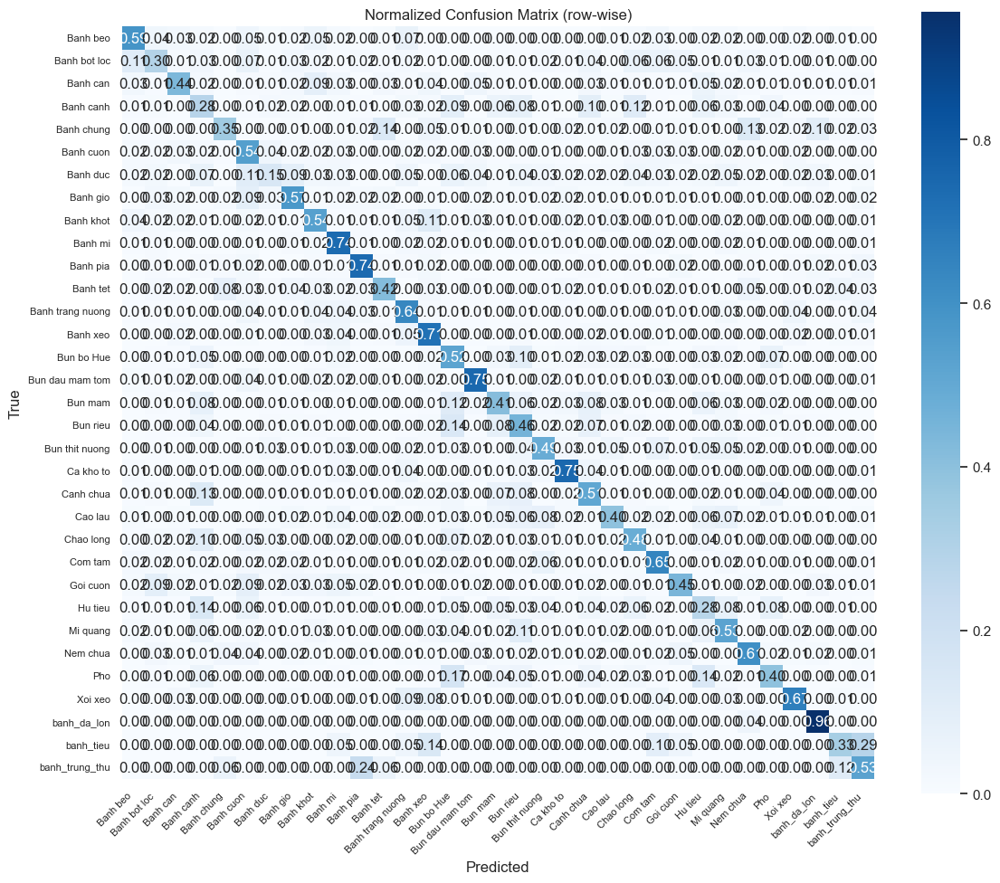

In [58]:
cm = confusion_matrix(y_true, y_pred, labels=list(range(len(class_names))))
cm_norm = (cm.T / cm.sum(axis=1, keepdims=True).T).T
cm_norm = np.nan_to_num(cm_norm)

plt.figure(figsize=(12,10))
sns.heatmap(cm_norm, cmap="Blues", xticklabels=class_names, yticklabels=class_names,
            annot=True, fmt=".2f", square=True, cbar=True)
plt.title("Normalized Confusion Matrix (row-wise)")
plt.xlabel("Predicted"); plt.ylabel("True")
plt.xticks(rotation=45, ha="right", fontsize=8)
plt.yticks(fontsize=8)
plt.tight_layout(); plt.show()


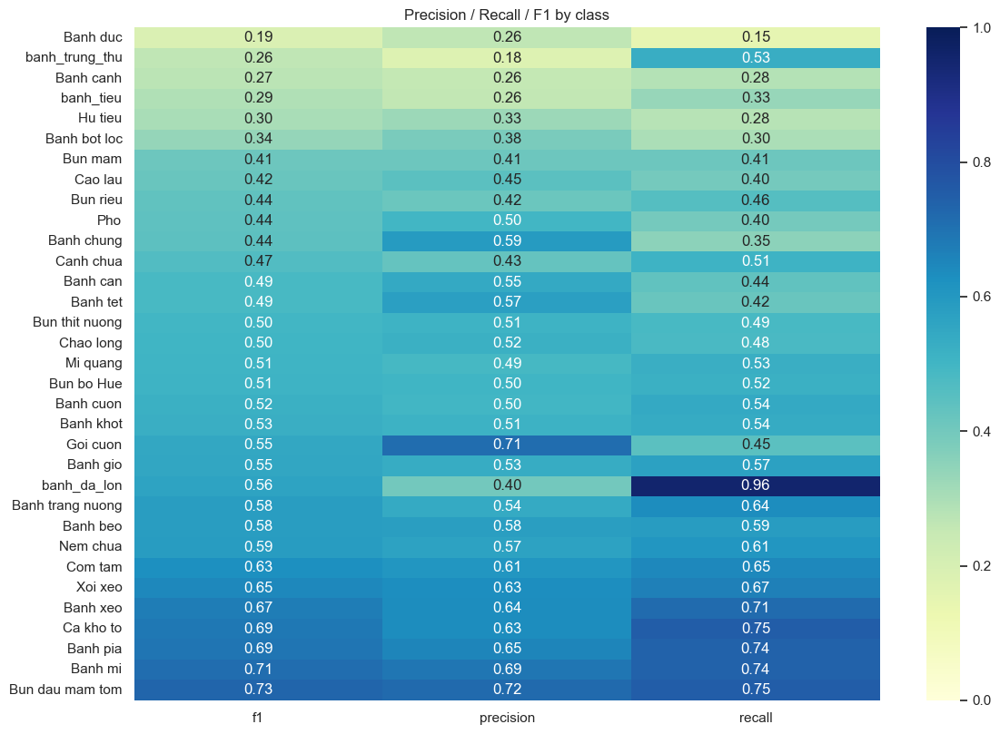

In [59]:
df_melt = df_prf.melt(id_vars="class", value_vars=["precision","recall","f1"],
                      var_name="metric", value_name="score")
order = df_prf.sort_values("f1")["class"].tolist()

plt.figure(figsize=(12, max(6, len(order)*0.25)))
pivot = df_melt.pivot(index="class", columns="metric", values="score").loc[order]
sns.heatmap(pivot, annot=True, fmt=".2f", cmap="YlGnBu", vmin=0, vmax=1)
plt.title("Precision / Recall / F1 by class")
plt.xlabel(""); plt.ylabel("")
plt.tight_layout(); plt.show()


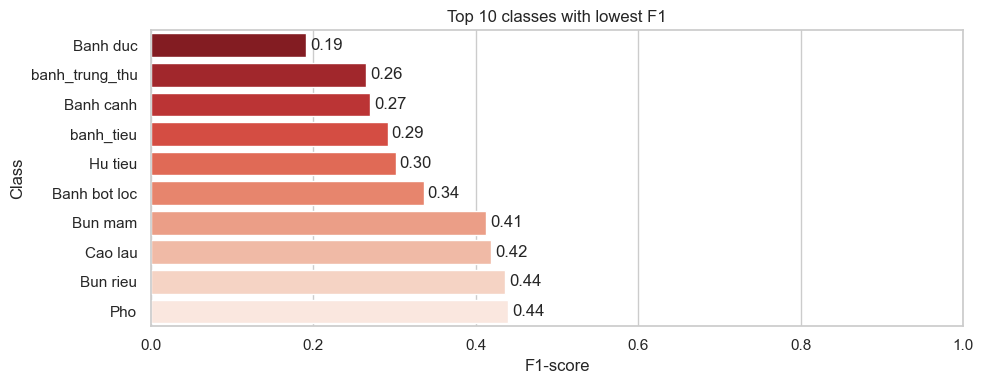

,class,precision,recall,f1,support
6,Banh duc,0.263158,0.150376,0.191388,133.0
32,banh_trung_thu,0.176471,0.529412,0.264706,17.0
3,Banh canh,0.257009,0.284974,0.270270,193.0
31,banh_tieu,0.259259,0.333333,0.291667,21.0
25,Hu tieu,0.327381,0.279188,0.301370,197.0
1,Banh bot loc,0.383929,0.298611,0.335938,144.0
16,Bun mam,0.412903,0.412903,0.412903,155.0
21,Cao lau,0.445455,0.395161,0.418803,124.0
17,Bun rieu,0.415686,0.458874,0.436214,231.0
28,Pho,0.496124,0.395062,0.439863,162.0


In [60]:
df_worst = df_prf.sort_values("f1", ascending=True).head(TOP_N_WORST)

plt.figure(figsize=(10, max(4, TOP_N_WORST*0.4)))
sns.barplot(data=df_worst, y="class", x="f1", palette="Reds_r")
plt.title(f"Top {TOP_N_WORST} classes with lowest F1")
plt.xlabel("F1-score"); plt.ylabel("Class")
for i, v in enumerate(df_worst["f1"]):
    plt.text(v+0.005, i, f"{v:.2f}", va="center")
plt.xlim(0,1)
plt.tight_layout(); plt.show()

df_worst


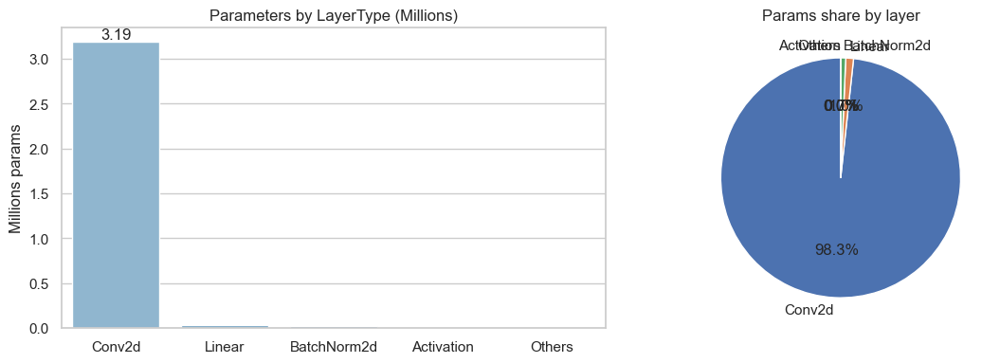

,LayerType,Params,Params_Million
0,Conv2d,3185088,3.185088
4,Linear,33825,0.033825
1,BatchNorm2d,21888,0.021888
2,Activation,0,0.000000
3,Others,0,0.000000


In [61]:
def param_count_by_type(m):
    from collections import defaultdict
    groups = defaultdict(int)
    for name, module in m.named_modules():
        if len(list(module.children())) > 0:
            continue  # chỉ tính leaf module
        n_params = sum(p.numel() for p in module.parameters() if p.requires_grad)
        if isinstance(module, nn.Conv2d):
            groups["Conv2d"] += n_params
        elif isinstance(module, nn.BatchNorm2d):
            groups["BatchNorm2d"] += n_params
        elif isinstance(module, nn.Linear):
            groups["Linear"] += n_params
        elif isinstance(module, (nn.ReLU, nn.SiLU, nn.GELU, nn.LeakyReLU)):
            groups["Activation"] += n_params
        else:
            groups["Others"] += n_params
    return groups

groups = param_count_by_type(model)
df_params = pd.DataFrame({"LayerType": list(groups.keys()),
                          "Params": list(groups.values())})
df_params["Params_Million"] = df_params["Params"] / 1e6
df_params.sort_values("Params", ascending=False, inplace=True)

fig, ax = plt.subplots(1,2, figsize=(12,4))
sns.barplot(data=df_params, x="LayerType", y="Params_Million", ax=ax[0], palette="Blues_d")
ax[0].set_title("Parameters by LayerType (Millions)")
ax[0].set_xlabel(""); ax[0].set_ylabel("Millions params")
ax[0].bar_label(ax[0].containers[0], fmt="%.2f")

ax[1].pie(df_params["Params"], labels=df_params["LayerType"], autopct="%1.1f%%", startangle=90)
ax[1].set_title("Params share by layer")
plt.tight_layout(); plt.show()

df_params


Top confused pairs (count, True, Pred):
   32 | Bun rieu -> Bun bo Hue
   30 | Bun bo Hue -> Bun rieu
   28 | Hu tieu -> Banh canh
   27 | Pho -> Bun bo Hue
   23 | Pho -> Hu tieu


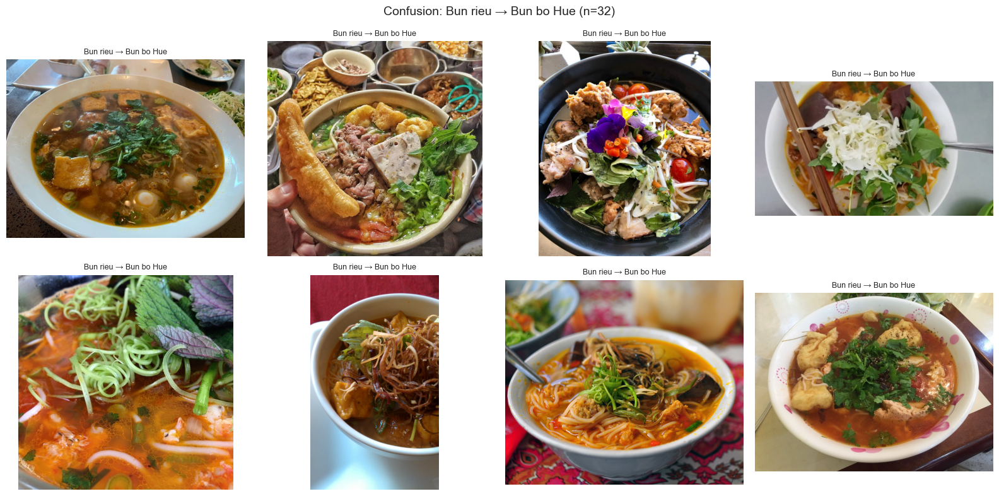

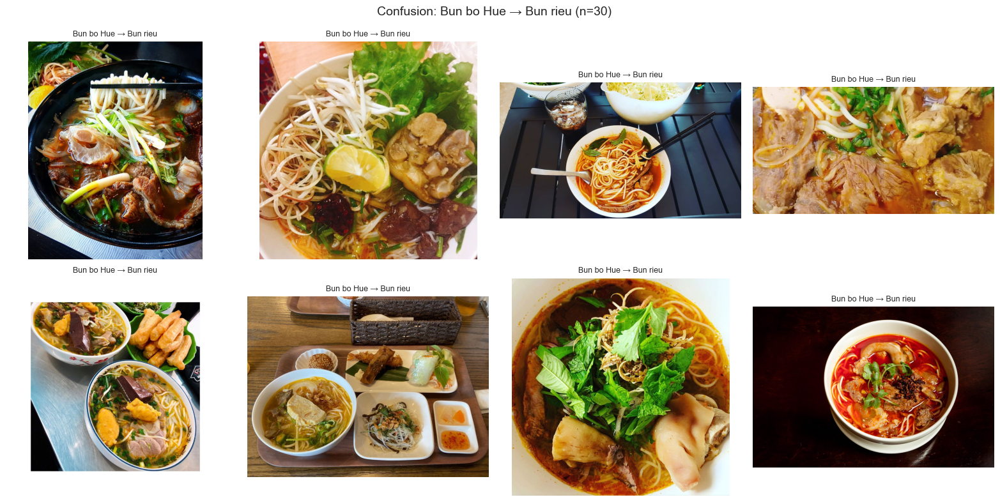

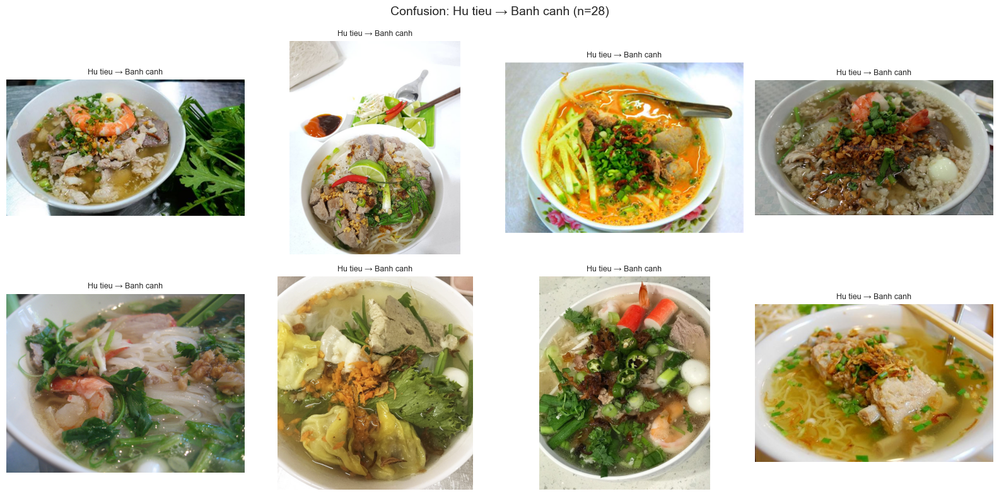

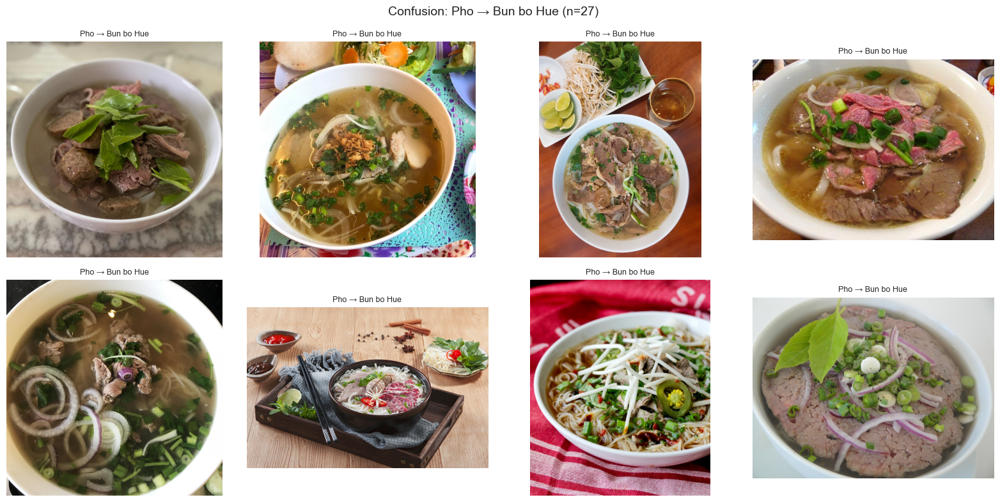

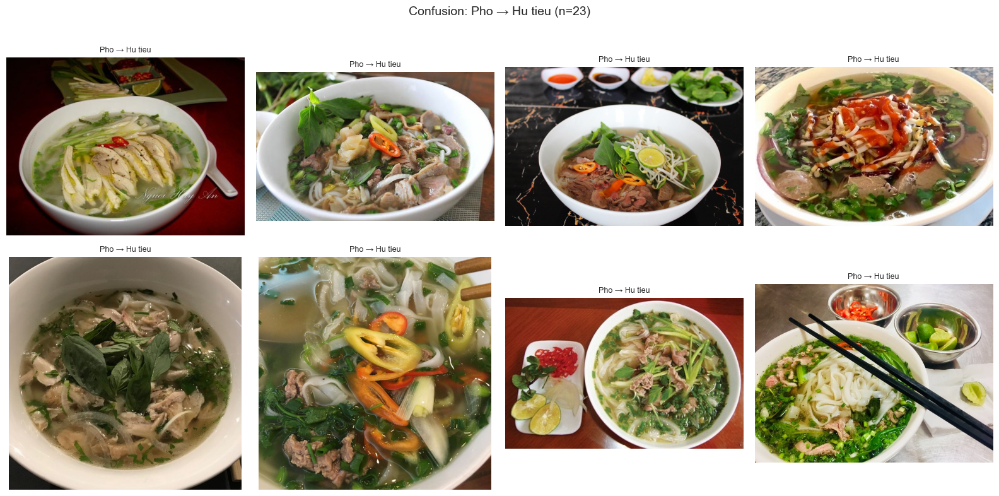

In [62]:
K = 5          # số cặp muốn xem
N_SAMPLES = 8  # số ảnh minh họa mỗi cặp

y_true_arr = np.asarray(y_true)
y_pred_arr = np.asarray(y_pred)

cm_counts = confusion_matrix(y_true, y_pred, labels=list(range(len(class_names))))
pairs = []
for i in range(cm_counts.shape[0]):
    for j in range(cm_counts.shape[1]):
        if i == j:
            continue
        c = cm_counts[i, j]
        if c > 0:
            pairs.append((c, i, j))

pairs.sort(reverse=True)
top_pairs = pairs[:K]

print("Top confused pairs (count, True, Pred):")
for c, ti, pj in top_pairs:
    print(f"{c:5d} | {class_names[ti]} -> {class_names[pj]}")

for c, ti, pj in top_pairs:
    idxs = np.where((y_true_arr == ti) & (y_pred_arr == pj))[0]
    if len(idxs) == 0:
        continue
    pick = idxs[:N_SAMPLES]
    ncols = 4
    nrows = math.ceil(len(pick)/ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*4, nrows*4))
    axes = np.array(axes).reshape(nrows, ncols)
    for ax in axes.flat: 
        ax.axis("off")
    fig.suptitle(f"Confusion: {class_names[ti]} → {class_names[pj]} (n={len(idxs)})", fontsize=14)
    for ax, idx in zip(axes.flat, pick):
        path, _ = ds_test.samples[idx]  # ImageFolder trả (path, label)
        try:
            img = Image.open(path).convert("RGB")
            ax.imshow(img)
            ax.set_title(f"{class_names[ti]} → {class_names[pj]}", fontsize=9)
        except Exception as e:
            ax.set_title(f"Err: {e}", fontsize=8)
    plt.tight_layout(); plt.show()


In [63]:
out_dir = Path(OUT_DIR); out_dir.mkdir(parents=True, exist_ok=True)

# Lưu classification report text
rep_txt = classification_report(y_true, y_pred, target_names=class_names, digits=4, zero_division=0)
(out_dir / "classification_report.txt").write_text(
    f"Top-1 Acc: {acc1:.2f}%\n" + " | ".join([f"Top-{k}: {v:.2f}%" for k,v in topk.items()]) + "\n\n" + rep_txt,
    encoding="utf-8"
)

# Lưu normalized confusion matrix
plt.figure(figsize=(12,10))
sns.heatmap(cm_norm, cmap="Blues", xticklabels=class_names, yticklabels=class_names,
            annot=True, fmt=".2f", square=True, cbar=True)
plt.title("Normalized Confusion Matrix (row-wise)")
plt.xlabel("Predicted"); plt.ylabel("True")
plt.xticks(rotation=45, ha="right", fontsize=8)
plt.yticks(fontsize=8)
plt.tight_layout()
plt.savefig(out_dir / "confusion_matrix_normalized.png", dpi=180, bbox_inches="tight")
plt.close()

str(out_dir.resolve())


'C:\\Users\\Admin\\OneDrive\\DOCKER\\Apps\\DL-DuDoan33MonAnVietNam\\reports\\seaborn_eval'